In [1]:
import plotly
import numpy
import pandas as pd
import geopandas as gpd
import os
from matplotlib import pyplot as plt
import json
import bokeh
%matplotlib inline

In [2]:
path1 = os.chdir("C:/Users/LXB19/Documents/NWJ2019/WA_BlockGroups")

In [3]:
WA_block = gpd.read_file("tl_2018_53_bg.shp").copy()

In [4]:
WA_block.crs = {'init' :'epsg:2285'}

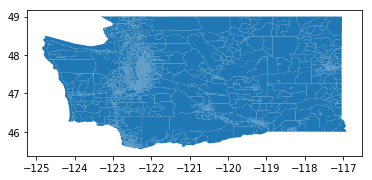

In [5]:
ax = WA_block.plot()

In [6]:
WA_00 = gpd.read_file("C:/Users/LXB19/Documents/NWJ2019/WA_blk_census00/bg00.shp")

In [7]:
WA_10 = gpd.read_file("C:/Users/LXB19/Documents/NWJ2019/WA_blk_census10/bg10.shp")

In [8]:
WA_10.head()

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,INTPTLON10,INTPTLAT10,...,POPTWO,POPHISP,POPWHITE2,POPBLACK2,POPAIAN2,POPASIAN2,POPNHOPI2,POPOTH2,POPTWO2,geometry
0,53,001,950100,1,530019501001,Block Group 1,G5030,S,-118.398815,47.150809,...,10,17,695,0,10,1,0,0,6,"POLYGON ((2077217.074095237 640954.0110817049,..."
1,53,001,950100,2,530019501002,Block Group 2,G5030,S,-118.351143,47.135101,...,18,40,1098,1,7,5,0,0,15,"POLYGON ((2165913.051240579 657352.8005365322,..."
2,53,001,950100,3,530019501003,Block Group 3,G5030,S,-118.382148,47.138222,...,12,55,477,1,6,3,0,0,10,"POLYGON ((2166254.454566129 657810.7137267586,..."
3,53,001,950200,1,530019502001,Block Group 1,G5030,S,-118.219484,46.874027,...,6,16,402,2,5,0,0,0,5,"POLYGON ((2150159.78406948 554295.8999707696, ..."
4,53,001,950200,2,530019502002,Block Group 2,G5030,S,-118.522323,46.968569,...,22,70,619,10,0,8,0,0,14,"POLYGON ((2082999.834788324 575018.8611698836,..."


In [9]:
data = pd.read_csv('C:/Users/LXB19/Documents/NWJ2019/ACS_17_5YR_B19001/ACS_17_5YR_B19001_with_ann.csv').copy()

In [10]:
data = data.drop([0])

In [11]:
data = data.rename(index=str, columns = {"GEO.id2":"GEOID10"})

In [12]:
income = WA_10.merge(data, on='GEOID10').dropna()

In [13]:
income.head()

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,INTPTLON10,INTPTLAT10,...,HD01_VD13,HD02_VD13,HD01_VD14,HD02_VD14,HD01_VD15,HD02_VD15,HD01_VD16,HD02_VD16,HD01_VD17,HD02_VD17
0,53,033,000100,1,530330001001,Block Group 1,G5030,S,-122.281516,47.727687,...,93,83,63,50,13,21,93,62,183,70
1,53,033,000100,2,530330001002,Block Group 2,G5030,S,-122.292469,47.729317,...,100,67,67,68,28,24,6,13,16,26
2,53,033,000100,3,530330001003,Block Group 3,G5030,S,-122.289456,47.722809,...,94,81,84,58,17,28,69,56,36,40
3,53,033,000100,4,530330001004,Block Group 4,G5030,S,-122.294453,47.731937,...,117,67,78,86,15,25,0,12,0,12
4,53,033,000100,5,530330001005,Block Group 5,G5030,S,-122.294437,47.722928,...,57,71,14,21,18,29,46,42,15,25


In [14]:
income_json = json.loads(income.to_json())
json_data = json.dumps(income_json)

In [15]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.palettes import brewer

In [16]:
geosource = GeoJSONDataSource(geojson = json_data)

In [17]:
palette = brewer['YlGnBu'][8]

In [18]:
palette = palette[::-1]

In [19]:
color_mapper = LinearColorMapper(palette = palette, low = 0, high = 40)

In [20]:
tick_labels = {'0': '0%', '5': '5%', '10':'10%', '15':'15%', '20':'20%', '25':'25%', '30':'30%','35':'35%', '40': '>40%'}

In [21]:
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)

In [22]:
p = figure(title = 'WA Income', plot_height = 600 , plot_width = 950, toolbar_location = None)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

In [23]:
p.patches('xs','ys', source = geosource,fill_color = {'field' :'HD01_VD15', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)

GlyphRenderer(id='1043', ...)

In [24]:
p.add_layout(color_bar, 'below')

In [25]:
output_notebook()

Loading BokehJS ...

In [26]:
show(p)

In [51]:
subset = data[data.columns[data.columns.to_series().str.contains('HD01')]].copy()

In [ ]:
subset = subset.astype(int)

In [53]:
subset.head()

,HD01_VD01,HD01_VD02,HD01_VD03,HD01_VD04,HD01_VD05,HD01_VD06,HD01_VD07,HD01_VD08,HD01_VD09,HD01_VD10,HD01_VD11,HD01_VD12,HD01_VD13,HD01_VD14,HD01_VD15,HD01_VD16,HD01_VD17
1,608,78,0,0,15,15,0,15,0,0,10,30,93,63,13,93,183
2,758,67,75,19,18,19,14,79,63,51,97,39,100,67,28,6,16
3,724,98,67,62,41,11,0,0,0,30,36,79,94,84,17,69,36
4,1052,148,45,106,130,54,34,140,10,12,122,41,117,78,15,0,0
5,637,37,43,43,75,80,27,27,27,13,57,58,57,14,18,46,15


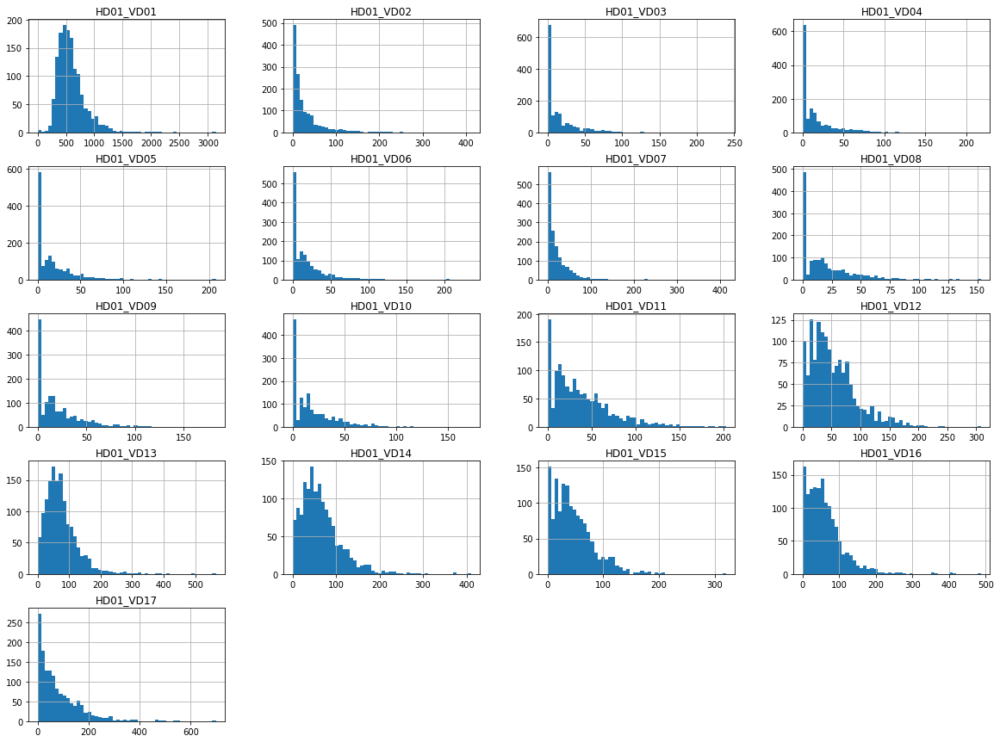

In [62]:
subset.hist(bins=50, figsize=(20,15))
plt.show()